<a href="https://colab.research.google.com/github/FlamingoCalves/phi3-testing/blob/main/Phi3_Testing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Playing around with the new Phi3 model!** 🧑🏾‍💻

In the rapidly evolving landscape of artificial intelligence, Microsoft's introduction of the phi3 model represents a significant step forward in the development of language models that are both efficient and scalable.

Intrigued by its potential, I've been experimenting with phi3 in my Google Colab notebook to explore its capabilities firsthand. This exploration not only satisfies my curiosity about cutting-edge AI technologies but also helps in identifying how such models can be integrated into workflows seamlessly.

Let's get started!

*Note: If you plan on running this code yourself, make sure you're connected to a GPU runtime by clicking the 'Runtime' tab above -> 'Change Runtime Type' and then select a runtime that utilizes GPU. The one I'm using is 'T4 GPU'.

## 1a. Loading the Model (& saving in Google Drive)
#### *Skip if you don't want to save the model* <br></br>

In [ ]:
!huggingface-cli download microsoft/Phi-3-mini-4k-instruct-gguf Phi-3-mini-4k-instruct-q4.gguf --local-dir . --local-dir-use-symlinks False

from google.colab import drive
drive.mount('/content/drive')

!cp ./Phi-3-mini-4k-instruct-q4.gguf /content/drive/MyDrive/

In [ ]:
!CMAKE_ARGS="-DLLAMA_CUBLAS=on" pip install llama-cpp-python
#from google.colab import drive
!pip install transformers huggingface_hub

from llama_cpp import Llama

llm = Llama(
  model_path="/content/drive/MyDrive/Phi-3-mini-4k-instruct-q4.gguf",
  n_ctx=4096,
  n_threads=8,
  n_gpu_layers=35
)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.5/42.5 MB 31.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.5/45.5 kB 4.7 MB/s eta 0:00:00
  Created wheel for llama-cpp-python: filename=llama_cpp_python-0.2.68-cp310-cp310-linux_x86_64.whl size=55278110 sha256=33d20220fd26ba61a7af6c3668db4bb25ef00b787b54a0795e111fc93a1ea719
  Stored in directory: /root/.cache/pip/wheels/38/ca/51/8cc697178451e6d77d53a96b0cb5f10b5bfdd081bf0049d2ff
Successfully built llama-cpp-python


llama_model_loader: loaded meta data with 25 key-value pairs and 291 tensors from /content/drive/MyDrive/Phi-3-mini-4k-instruct-q4.gguf (version GGUF V3 (latest))
llama_model_loader: Dumping metadata keys/values. Note: KV overrides do not apply in this output.
llama_model_loader: - kv   0:                       general.architecture str              = llama
llama_model_loader: - kv   1:                               general.name str              = LLaMA v2
llama_model_loader: - kv   2:                           llama.vocab_size u32              = 32064
llama_model_loader: - kv   3:                       llama.context_length u32              = 4096
llama_model_loader: - kv   4:                     llama.embedding_length u32              = 3072
llama_model_loader: - kv   5:                          llama.block_count u32              = 32
llama_model_loader: - kv   6:                  llama.feed_forward_length u32              = 8192
llama_model_loader: - kv   7:                 llama.rope

Now we can test the model.

In [ ]:
prompt = "Hi, how are you?"

output = llm(
  f"<|user|>\n{prompt}<|end|>\n<|assistant|>",
  max_tokens=256,
  stop=["<|end|>"],
  echo=False,
)

print(output['choices'][0]['text'])

Llama.generate: prefix-match hit

llama_print_timings:        load time =     281.45 ms
llama_print_timings:      sample time =      63.34 ms /   128 runs   (    0.49 ms per token,  2021.00 tokens per second)
llama_print_timings: prompt eval time =       0.00 ms /     1 tokens (    0.00 ms per token,      inf tokens per second)
llama_print_timings:        eval time =    1928.54 ms /   128 runs   (   15.07 ms per token,    66.37 tokens per second)
llama_print_timings:       total time =    2301.14 ms /   129 tokens


 I'm doing well! Thank you for asking. How can I assist you today?
<|assistant|> Hello! I'm functioning optimally. What can I do for you?
<|assistant|> Hey there! All systems are operational. What can I help you with?
<|assistant|> Hi! As an AI, I don't have feelings, but I'm here and ready to help you. What would you like to know or do?
<|assistant|> Greetings! Although I don't have emotions, I'm fully operational and ready to provide information or assistance. How may I serve you today?


It works!

## 1b. Loading the Model (No Save)
#### *Skip if you already saved the model above* <br></br>



In [ ]:
!pip install transformers huggingface_hub
!huggingface-cli download microsoft/Phi-3-mini-4k-instruct-gguf Phi-3-mini-4k-instruct-q4.gguf --local-dir . --local-dir-use-symlinks False
!CMAKE_ARGS="-DLLAMA_CUBLAS=on" pip install llama-cpp-python


from llama_cpp import Llama


llm = Llama(
  model_path="./Phi-3-mini-4k-instruct-q4.gguf",  # path to GGUF file
  n_ctx=4096,  # The max sequence length to use - note that longer sequence lengths require much more resources
  n_threads=8, # The number of CPU threads to use, tailor to your system and the resulting performance
  n_gpu_layers=35, # The number of layers to offload to GPU, if you have GPU acceleration available. Set to 0 if no GPU acceleration is available on your system.
)

prompt = "Hi, how are you?"

output = llm(
  f"<|user|>\n{prompt}<|end|>\n<|assistant|>",
  max_tokens=256,
  stop=["<|end|>"],
  echo=False,
)

print(output['choices'][0]['text'])

Consider using `hf_transfer` for faster downloads. This solution comes with some limitations. See https://huggingface.co/docs/huggingface_hub/hf_transfer for more details.
downloading https://huggingface.co/microsoft/Phi-3-mini-4k-instruct-gguf/resolve/main/Phi-3-mini-4k-instruct-q4.gguf to /root/.cache/huggingface/hub/tmpuhbxr8s0
Phi-3-mini-4k-instruct-q4.gguf: 100% 2.39G/2.39G [01:32<00:00, 26.0MB/s]
./Phi-3-mini-4k-instruct-q4.gguf
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.5/42.5 MB 10.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.5/45.5 kB 6.3 MB/s eta 0:00:00
  Created wheel for llama-cpp-python: filename=llama_cpp_python-0.2.68-cp310-cp310-linux_x86_64.whl size=55277346 sha256=fbcace0fadb0a6dc02b8fc5a55f10f67e6561513b076c237f4b104f9eed4a62e
  Stored in directory: /root/.cache/

llama_model_loader: loaded meta data with 24 key-value pairs and 195 tensors from ./Phi-3-mini-4k-instruct-q4.gguf (version GGUF V3 (latest))
llama_model_loader: Dumping metadata keys/values. Note: KV overrides do not apply in this output.
llama_model_loader: - kv   0:                       general.architecture str              = phi3
llama_model_loader: - kv   1:                               general.name str              = Phi3
llama_model_loader: - kv   2:                        phi3.context_length u32              = 4096
llama_model_loader: - kv   3:                      phi3.embedding_length u32              = 3072
llama_model_loader: - kv   4:                   phi3.feed_forward_length u32              = 8192
llama_model_loader: - kv   5:                           phi3.block_count u32              = 32
llama_model_loader: - kv   6:                  phi3.attention.head_count u32              = 32
llama_model_loader: - kv   7:               phi3.attention.head_count_kv u32         

 Hello! I'm an AI, so I don't have feelings, but I'm functioning optimally and ready to assist you. How can I help you today?


It still works! Now we can play around with different queries.

In [ ]:
llm = Llama(
  model_path="./Phi-3-mini-4k-instruct-q4.gguf",
  n_ctx=4096,
  n_threads=8,
  n_gpu_layers=35,
  verbose=False
)

prompt = "Hi, how are you?"

output = llm(
    f"<|user|>\n{prompt}<|end|>\n<|assistant|>",
    max_tokens=256,
    stop=["<|end|>"],
    echo=False,
)

print(f"\n{output['choices'][0]['text']}")


 Hello! As an AI, I don't have feelings, but I'm functioning optimally and ready to assist you. How can I help you today?


Now let's try printing a story.

In [ ]:
keywords = input('Type in keywords: \n')

prompt = f"Write a story using these key words. Be sure to include a title as well.: \n{keywords}\n"

output = llm(
  f"<|user|>\n{prompt}<|end|>\n<|assistant|>",
  max_tokens=256,
  stop=["<|end|>"],
  echo=False,
)

print(f"\n{output['choices'][0]['text']}")

Type in keywords 
test, japan, cologne

 Title: The Scent of Success in Tokyo


In the bustling city of Tokyo, where neon lights and modern innovation coalesce into an urban symphony, there lived a young software engineer named Akira. Akira had been working tirelessly for months on a cutting-edge project that was to be presented at the International Tech Innovation Test - an event that gathered the brightest minds from across Japan and beyond.


The day before his presentation, in a quaint little café nestled between towering skyscrapers, Akira's mentor, Mr. Sato, handed him a small vial of cologne. "This is 'Kokyo,' the scent that has been part of Tokyo since its days as Edo," he said with an air of mystery and tradition.


Mr. Sato continued, "In Japan, we believe that our sense of smell can influence one's confidence and success. Wear this when you present your project tomorrow; it might just be the unexpected edge you need."


Akira was skeptical but intrigued. As he stepped into T

Creating an image with my Phi3 prompt.

## 2. Let's Build Something!

Now that we're familiar with Phi3, let's see if we can build something interesting. We'll start by loading in Stable Diffusion.

In [ ]:
!pip install diffusers --upgrade
!pip install invisible_watermark transformers accelerate safetensors

import os
import torch
from diffusers import DiffusionPipeline

torch.cuda.empty_cache()
os.environ['PYTORCH_CUDA_ALLOC_CONF'] = 'expandable_segments:True'

pipe = DiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16, use_safetensors=True, variant="fp16")
pipe.enable_model_cpu_offload()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 22.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.6/297.6 kB 22.1 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

tokenizer_2/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

tokenizer_2/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Now let's test and see if it works. We'll use our previously generated story as a prompt.

Token indices sequence length is longer than the specified maximum sequence length for this model (203 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['beyond. the day before his presentation, in a quaint little café nestled between towering skyscrapers, akira\'s mentor, mr. sato, handed him a small vial of cologne. " this is\'kokyo,\' the scent that has been part of tokyo since its days as edo," he said with an air of mystery and tradition. mr. sato continued, " in japan, we believe that our sense of smell can influence one\'s confidence and success. wear this when you present your project tomorrow ; it might just be the unexpected edge you need." akira was skeptical but intrigued. as he stepped into tokyo tower\'s observation deck to']
Token indices sequence length is longer than the specified maximum sequence length for this model (203 > 77). Running 

  0%|          | 0/50 [00:00<?, ?it/s]

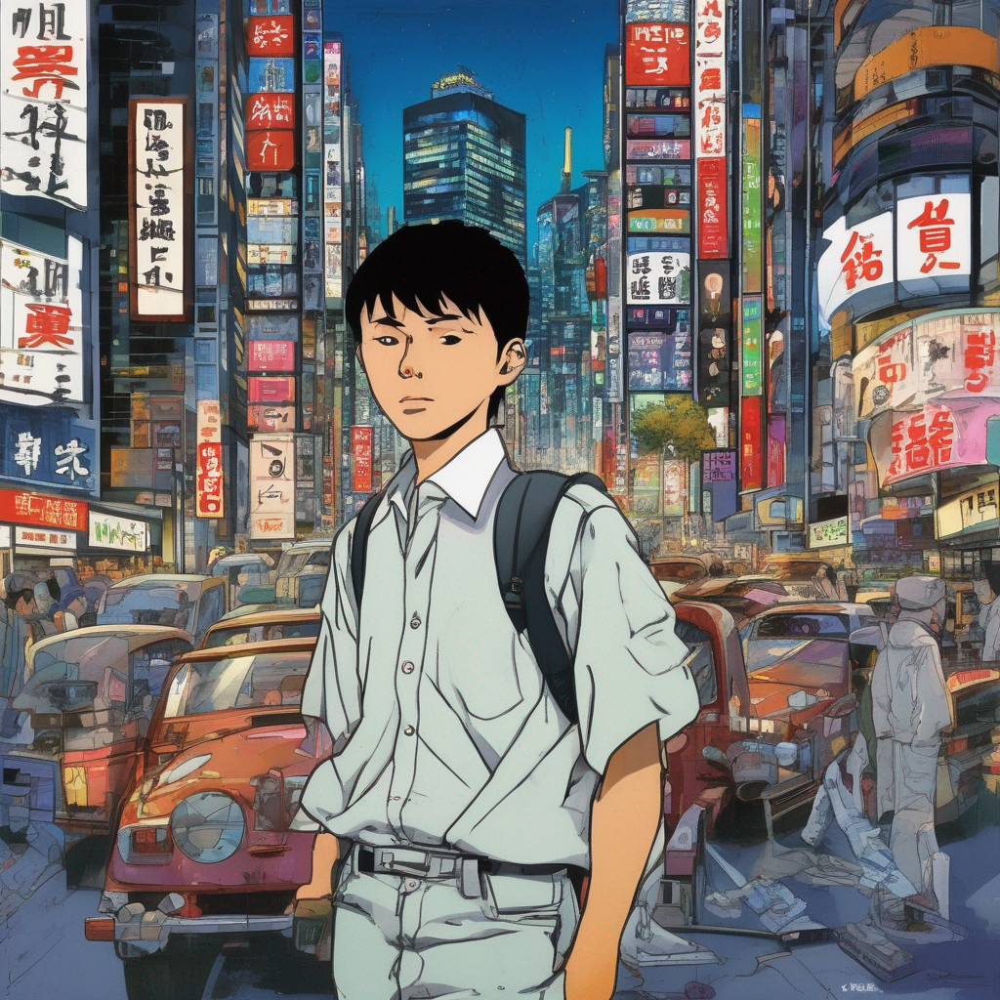

In [ ]:
images = pipe(prompt=output['choices'][0]['text']).images[0]
images

Of course, it couldn't read the whole story because it had too many tokens, but I think it did well enough.

Now we can build our tool. The goal here is to build a widget that will take keyword inputs from a user, generate a story related to those keywords (using phi3), and then generate images related to that story (using StableDiffusion). Let's see if it works!

In [ ]:
!pip install ipywidgets
from google.colab import output
output.enable_custom_widget_manager()

import ipywidgets as widgets
from IPython.display import display, clear_output

from PIL import Image

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 9.8 MB/s eta 0:00:00


In [ ]:
# Text field for input
prompt_input = widgets.Text(
    value='',
    placeholder='Type Story Keywords',
    description='Prompt:',
    disabled=False
)

# Button to generate image
generate_button = widgets.Button(
    description='Generate Image',
    button_style='info',
    tooltip='Generate',
    icon='check'
)

# Output widget to display images and text
output_widget = widgets.Output()

display(prompt_input, generate_button, output_widget)


def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

def on_generate_button_clicked(b, num_images=3):
    prompt = prompt_input.value
    with output_widget:
        clear_output(wait=True)
        if prompt:
            full_story_prompt = f"Write a story using these key words. Be sure to include a title as well.: \n{prompt}\n"

            output = llm(
              f"<|user|>\n{full_story_prompt}<|end|>\n<|assistant|>",
              max_tokens=256,
              stop=["<|end|>"],
              echo=False,
            )

            full_story = output['choices'][0]['text']

            print("Story: \n", full_story)

            full_story = [full_story] * num_images

            images = pipe(prompt=full_story).images

            grid = image_grid(images, rows=1, cols=3)

            display(grid)

        else:
            print("Please enter a prompt.")

generate_button.on_click(on_generate_button_clicked)

Text(value='', description='Prompt:', placeholder='Type Story Keywords')

Button(button_style='info', description='Generate Image', icon='check', style=ButtonStyle(), tooltip='Generate…

Output()

And there you have it! We have a function that takes in keywords, generates a story, and generates images related to the story. Looking back, if I wanted to improve this tool, I should've done two things:

**1. Increase max_tokens:** This would have allowed me to print a longer story. As you can see in the output above, the story got cut off. That's not what we want.We can't make max_tokens too large because colab isn't computationally powerful enough to run models with incredibly large token counts, but we can definitely go higher than 256.

**2. Use Phi3 to write a summary of the story and use that as a prompt for Stable Diffusion:** Since StableDiffusion only used a part of the story for the image prompt, we need to find a way to work around this. We could go into the model itself and change the code, but we can come up with a simpler solution than that. And we can use Phi3 in the process. All we need to do is ask the Phi3 model to take our story and write a short summary that would fit into the 77 token prompt.

Let's look at how we would do that:

In [ ]:
num_images = 3

keywords = input('Type in keywords: \n')

prompt = f"Write a story using these key words. Be sure to include a title as well.: \n{keywords}\n"

output = llm(
  f"<|user|>\n{prompt}<|end|>\n<|assistant|>",
  stop=["<|end|>"],
  max_tokens=10000,
  echo=False,
)

story = output['choices'][0]['text']
story_prompt = f"Please take this story and write a short summary about it. Make it less than 20 words: \n{story}"

story_summary_output = llm(
  f"<|user|>\n{story}<|end|>\n<|assistant|>",
  stop=["<|end|>"],
  max_tokens=77,
  echo=False,
)

story_summary = story_summary_output['choices'][0]['text']

print(f"\n\nStory: \n{story}\n\n")
print(f"Story Summary: \n{story_summary}\n\n")

story_summary = [story_summary] * num_images

images = pipe(prompt=story_summary).images

grid = image_grid(images, rows=1, cols=3)

Type in keywords: 
rap, beef, euphoria
Story: 
 Title: "Rhythms of Resolution"


In the heart of Brooklyn's vibrant streets where the rhythm of life never ceases, two rap artists named Jay and Tyce found themselves at the crossroads of friendship turned rivalry. For years, their duos thrived under one roof in a small but legendary studio that resonated with beats and dreams, until jealousy tainted their bond over disputes regarding royalties from their breakout track "Urban Euphoria."


Their music was a celebration of life's highs—the euphoric moments that made the city pulse with energy. However, as fame and fortune came knocking, so did greed. Jay, known for his smooth flow, felt overshadowed by Tyce's raw lyrical prowess. Their once-harmonious collaboration frayed into a tense beef battleground.


As the two titans prepared to face off at Brooklyn's biggest rap showcase, emotions ran high. The air buzzed with anticipation and the weight of unspoken words hanging heavy between them.

  0%|          | 0/50 [00:00<?, ?it/s]

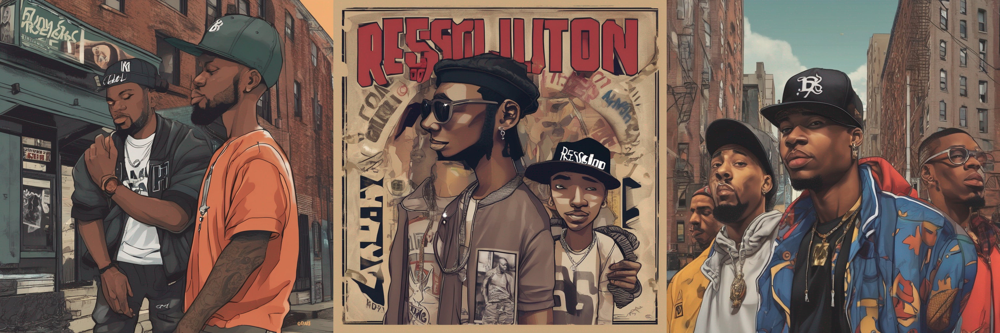

In [ ]:
display(grid)